<a href="https://colab.research.google.com/github/Peheppy/LSTM_bitcoin_forecasting/blob/main/LSTM_bitcoin_forecasting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Previsão de série temporal utilizando LSTM
## Redes Neurais 2025.1
## Grupo 07 (wjls, phas2, jgpt, vjmm, lfasm)


## Imports

In [ ]:
!pip install torchinfo

In [ ]:
from google.colab.files import upload
import pandas as pd
from datetime import datetime, timedelta
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.tools import diff
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import torch.optim as optim
import torch
from tqdm import tqdm
from torch.utils.data import TensorDataset, DataLoader
from torchinfo import summary
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
import torch.nn as nn
import time

palette = [
    "#445E93",
    "#D6343C",
    "#FEC974",
    "#FCB0B3",
    "#B0CFEA",
    "#A1DE7E",
    "#C38BE0",
    "#FCECC9",

]
cmap = LinearSegmentedColormap.from_list("jgpt_heat", [palette[0], palette[-1]], gamma=2.5)
plt.colormaps.unregister("jgpt_heat")
plt.colormaps.register(cmap)
sns.set_theme(style="darkgrid", palette=palette)

## Obtenção dos dados

Fazer o upload do arquivo `data-bitcoin_timedata_v2.csv`

In [ ]:
_ = upload()

Saving data-bitcoin_timedata_v2.csv to data-bitcoin_timedata_v2.csv


In [ ]:
data = pd.read_csv('/content/data-bitcoin_timedata_v2.csv')
data

,date,open,high,low,close,number_of_trades
0,2017-08-17,4261.48,4485.39,4200.74,4285.08,3427
1,2017-08-18,4285.08,4371.52,3938.77,4108.37,5233
2,2017-08-19,4108.37,4184.69,3850.00,4139.98,2153
3,2017-08-20,4139.98,4211.08,4032.62,4086.29,2321
4,2017-08-21,4069.13,4119.62,3911.79,4016.00,3972
...,...,...,...,...,...,...
2171,2023-07-28,29222.78,29542.22,29123.12,29314.14,543177
2172,2023-07-29,29314.14,29406.92,29256.18,29352.90,339750
2173,2023-07-30,29352.90,29449.00,29033.24,29281.09,454846
2174,2023-07-31,29281.09,29530.00,29101.80,29232.25,563115


In [ ]:
# Converte a coluna 'date' para datetime
data['date'] = pd.to_datetime(data['date'])

## Análise exploratória dos dados

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2176 entries, 0 to 2175
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   date              2176 non-null   datetime64[ns]
 1   open              2176 non-null   float64       
 2   high              2176 non-null   float64       
 3   low               2176 non-null   float64       
 4   close             2176 non-null   float64       
 5   number_of_trades  2176 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 102.1 KB


Observa-se ausência de valores faltantes. Temos 2176 samples à disposição com a coluna `close` contendo a série a ser utilizada no modelo, inicialmente, autoregressivo.

In [ ]:
data.drop('date', axis=1, inplace=False).describe()

,open,high,low,close,number_of_trades
count,2176.000000,2176.000000,2176.000000,2176.000000,2.176000e+03
mean,20074.277578,20613.574283,19468.753051,20085.572486,1.462627e+06
std,16058.230026,16490.568746,15560.344106,16055.913598,2.057254e+06
min,3188.010000,3276.500000,2817.000000,3189.020000,2.153000e+03
25%,7627.735000,7829.747500,7424.250000,7628.355000,2.803172e+05
50%,11705.580000,11933.360000,11334.110000,11728.035000,7.407820e+05
75%,29866.525000,30423.460000,29224.382500,29866.532500,1.595982e+06
max,67525.820000,69000.000000,66222.400000,67525.830000,1.522359e+07


In [ ]:
main_series = data['close']

lags = [main_series]
names = ["x(t)"]
max_lag = 150

for i in range(1, max_lag + 10, 10):
    names.append(f"x(t-{i})")
    lags.append(main_series.shift(i))

lags = pd.concat(lags, axis=1).iloc[1:]
lags.columns = names

In [ ]:
lags = lags.iloc[max_lag:]
lags

,x(t),x(t-1),x(t-11),x(t-21),x(t-31),x(t-41),x(t-51),x(t-61),x(t-71),x(t-81),x(t-91),x(t-101),x(t-111),x(t-121),x(t-131),x(t-141),x(t-151)
151,13539.93,13474.99,15059.54,13699.34,17539.83,11699.99,8700.01,7240.06,7345.01,5861.77,5760.02,4369.00,3882.35,3714.95,4619.77,4310.01,4285.08
152,10900.00,13539.93,16960.39,15689.01,19102.66,13550.05,9128.02,7864.50,6960.12,5768.83,5595.00,4423.00,4193.00,3699.99,4691.61,4386.69,4108.37
153,10988.79,10900.00,17069.79,15459.99,18860.02,16599.00,9650.00,7699.19,7064.04,5719.64,5512.06,4640.00,4174.50,4035.01,4282.80,4587.48,4139.98
154,10961.97,10988.79,16150.03,14182.11,18856.25,15880.00,9896.80,7761.94,7303.00,6169.98,5683.90,4786.95,4174.69,3910.04,4258.81,4555.14,4086.29
155,11474.98,10961.97,14902.54,14378.90,17295.20,14656.07,9687.88,8038.00,7079.99,6120.50,6010.01,4783.06,4378.51,3900.00,4130.37,4724.89,4016.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2171,29314.14,29222.78,30138.00,30344.70,30692.44,26516.99,26339.34,28065.00,26821.28,27668.79,29311.70,30380.01,27938.38,28348.60,27972.87,20362.22,23492.09
2172,29352.90,29314.14,29859.13,30284.63,30077.41,26339.97,26498.61,27736.40,26880.26,27628.27,29230.45,28797.10,28323.76,28028.53,27717.01,20150.69,23141.57
2173,29281.09,29352.90,29909.21,30160.71,30447.31,26844.35,26477.81,27694.40,27102.43,27598.75,29233.21,28243.65,29637.34,28465.36,28105.47,20455.73,23628.97
2174,29232.25,29281.09,29800.00,30411.57,30472.00,28307.99,25841.21,27210.35,26747.78,26968.62,28068.26,27262.84,30200.42,28452.73,27250.97,21997.11,23465.32


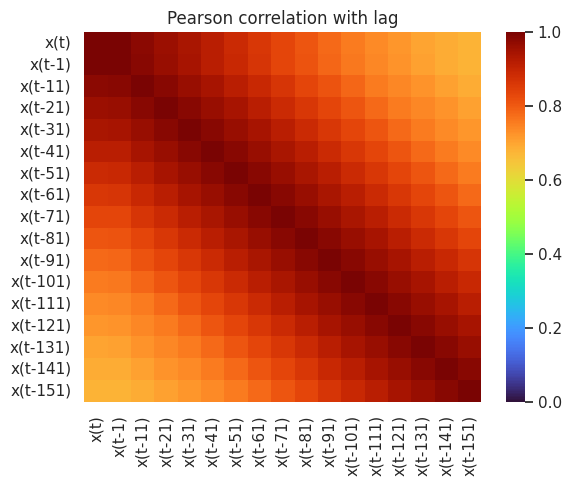

In [ ]:
ax = sns.heatmap(lags.corr(), vmin=0, cmap="turbo")
_ = ax.title.set_text("Pearson correlation with lag")

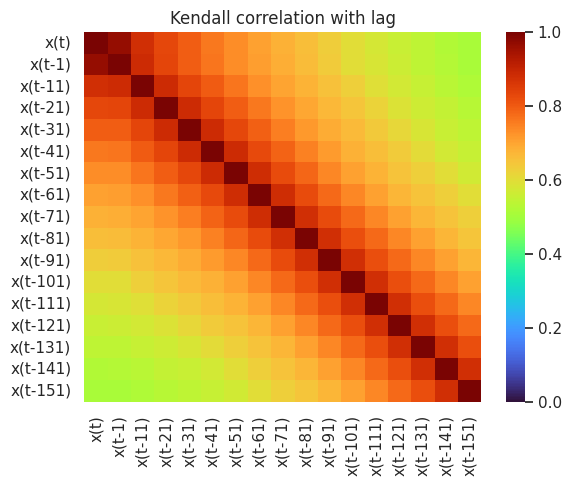

In [ ]:
ax = sns.heatmap(lags.corr(method="kendall"), vmin=0, cmap="turbo")
_ = ax.title.set_text("Kendall correlation with lag")

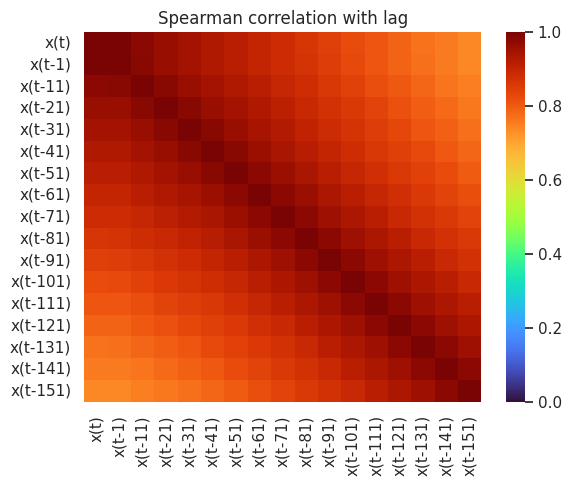

In [ ]:
ax = sns.heatmap(lags.corr(method="spearman"), vmin=0, cmap="turbo")
_ = ax.title.set_text("Spearman correlation with lag")

Pode-se observar que lags semanais, quinzenais, mensais, bimestrais e trimestrais são de interesse. A correlação decresce de forma contínua ao aumentar os lags (pode ser checado aumentando o valor de `max_lag`)

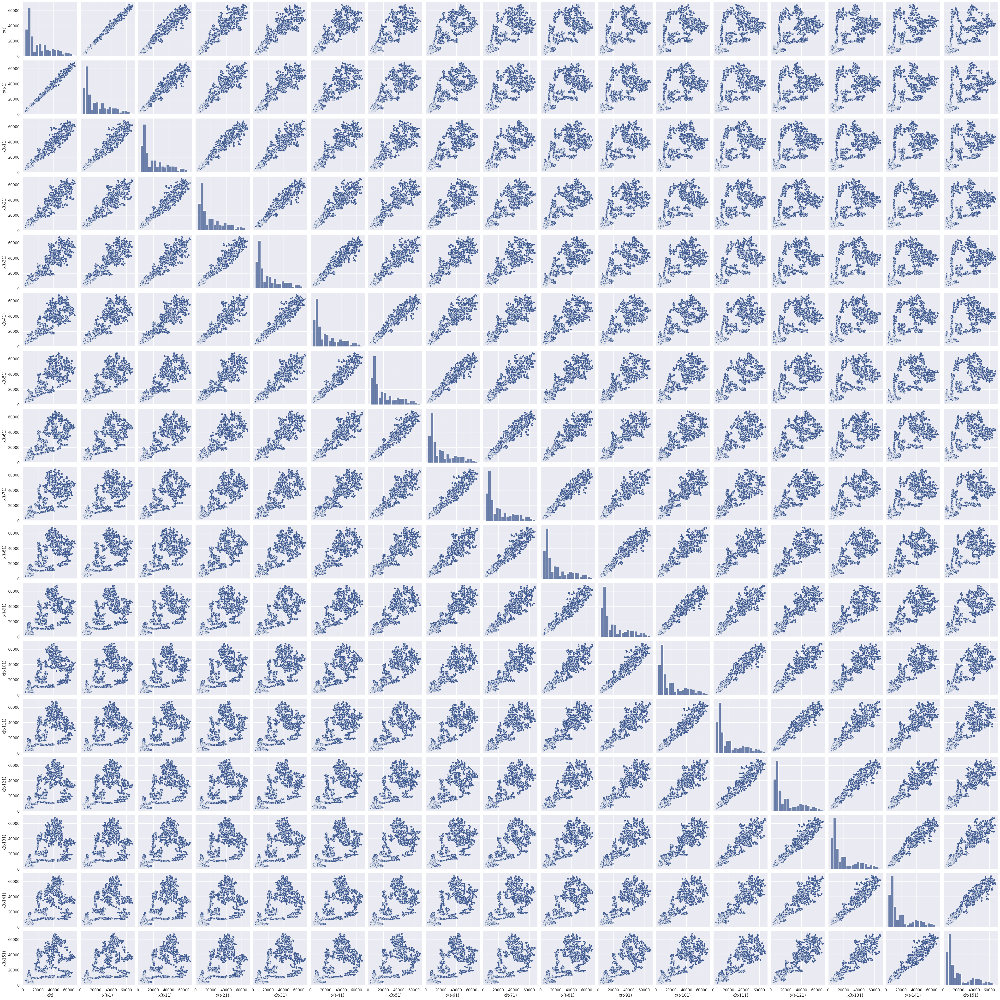

In [ ]:
_ = sns.pairplot(lags)

A figura acima confirma que existe sim uma aparente relação que se dissipa proporcional em relação distância no tempo

-----

Podemos fazer o split dos dados

In [ ]:
train_size = int(0.7 * len(data))
valid_size = int(0.1 * len(data))
test_size = len(data) - train_size - valid_size
data["split"] = ["train"] * train_size + ["valid"] * valid_size + ["test"] * test_size

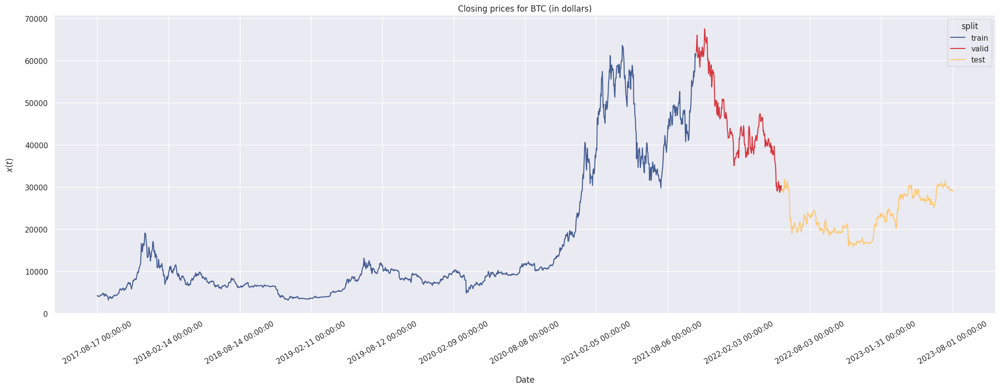

In [ ]:
fig = plt.figure(figsize=(25, 8))
ax = plt.gca()
_ = sns.lineplot(data=data, x="date", y="close", hue="split", ax=ax)
_ = ax.title.set_text("Closing prices for BTC (in dollars)")
num_ticks = 13
mask = np.linspace(0, len(data) - 1, num_ticks)
_ = ax.set_xticks(data["date"].iloc[mask], data["date"].iloc[mask], rotation=30)
_ = ax.set_ylabel(r"$x(t)$", rotation=90, labelpad=15)
_ = ax.set_xlabel("Date", labelpad=15)

In [ ]:
data.groupby("split").count()["close"]

,close
split,
test,436
train,1523
valid,217


Note que na prática, o split de treino diminui de tamanho de acordo com o tamanho da janela histórica analisada.

## Utilidades para treinamentos das redes

In [ ]:
def get_lagged_splits(data: pd.DataFrame, window_size: int) -> dict:
    """
    Returns train, validation, and test splits with window_size as maximum lag.

    Args:
        data (pd.DataFrame): DataFrame with 'split' and 'close' columns.
        window_size (int): Number of lagged time steps for X.

    Returns:
        dict: Dictionary with train, validation, and test splits containing X (lagged features) and y (target).

    Raises:
        ValueError: If window_size is invalid or data is not a DataFrame.
    """
    if not isinstance(data, pd.DataFrame):
        raise ValueError("Input 'data' must be a pandas DataFrame")
    if not isinstance(window_size, int) or window_size < 1:
        raise ValueError("window_size must be a positive integer")

    splits = {split: {"X": [], "y": []} for split in data["split"].unique()}

    for i in range(len(data) - window_size):
        split = data["split"].iloc[i + window_size]
        splits[split]["X"].append(data["close"].iloc[i:i + window_size].to_numpy())
        splits[split]["y"].append(float(data["close"].iloc[i + window_size]))

    for key in splits.keys():
        splits[key]["X"] = np.vstack(splits[key]["X"])
        splits[key]["y"] = np.array(splits[key]["y"], dtype=np.float32)

    return splits

Conforme nossas análises, as janelas históricas mais interessantes aparentam ser definidas como abaixo:

In [ ]:
splits_weekly = get_lagged_splits(data, 7)
splits_biweekly = get_lagged_splits(data, 15)
splits_monthly = get_lagged_splits(data, 30)
splits_bimonthly = get_lagged_splits(data, 60)
splits_trimonthly = get_lagged_splits(data, 90)

In [ ]:
splits_weekly["train"]["X"][-1], splits_weekly["train"]["y"][-1]

(array([54659.  , 57471.35, 55996.93, 57367.  , 57347.94, 61672.42,
        60875.57]),
 np.float32(61528.33))

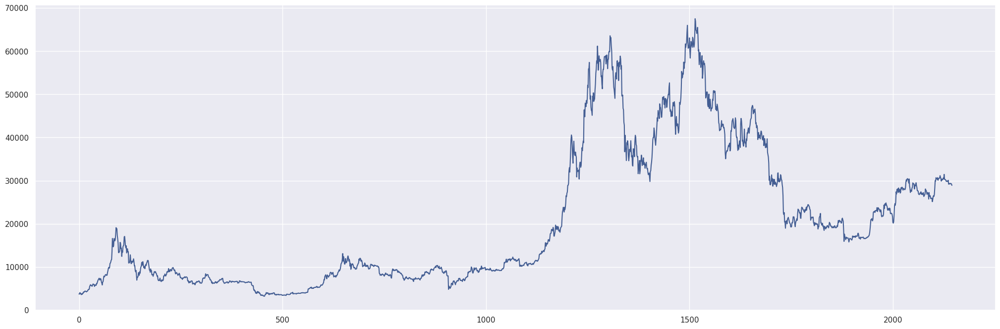

In [ ]:
y = np.hstack([splits_monthly["train"]["y"], splits_monthly["valid"]["y"], splits_monthly["test"]["y"]])
fig = plt.figure(figsize=(25, 8))
_ = plt.plot(y)

Os splits aparentam estar corretos!

---

## Analisando com um modelo simples

Como pode se ver pela correlação de Pearson acima, até mesmo um modelo simples provavelmente funcionaria para a previsão do próximo dia. Demonstramos isso com OLS:

In [ ]:
X, y = splits_weekly["train"]["X"], splits_weekly["train"]["y"]
ols_weekly_w = np.linalg.pinv(X) @ y

In [ ]:
pred_test_weekly = splits_weekly["test"]["X"] @ ols_weekly_w

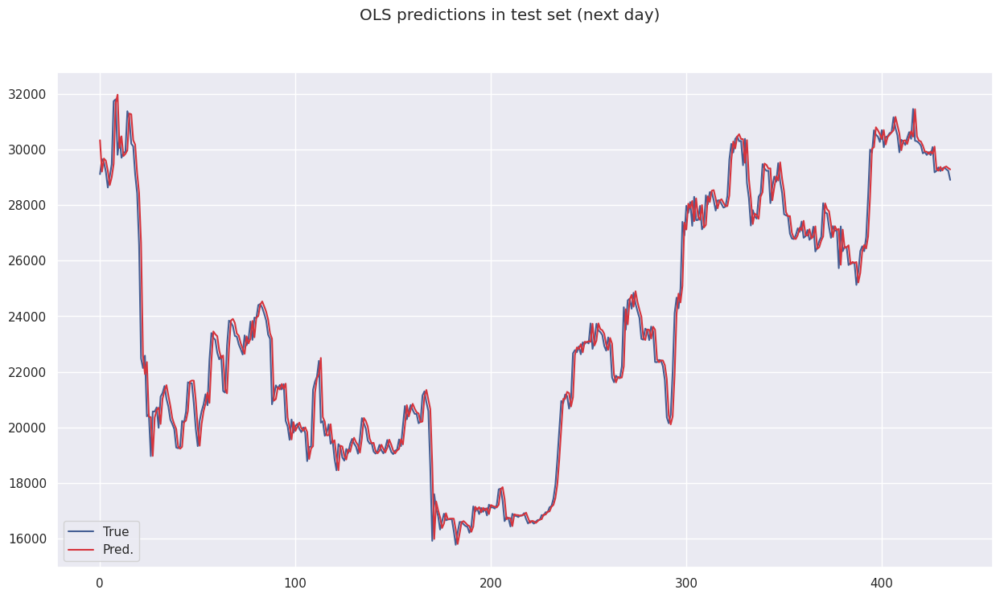

In [ ]:
fig = plt.figure(figsize=(15, 8))
_ = plt.suptitle("OLS predictions in test set (next day)")
_ = plt.plot(splits_weekly["test"]["y"], label="True")
_ = plt.plot(pred_test_weekly, label="Pred.")
_ = plt.legend()

MAPE:

In [ ]:
np.abs((splits_weekly["test"]["y"] - pred_test_weekly) / splits_weekly["test"]["y"]).mean()

np.float64(0.01910205201028136)

RMSE:

In [ ]:
np.sqrt(np.square(splits_weekly["test"]["y"] - pred_test_weekly).mean())

np.float64(666.0589450478993)

De acordo com o RMSE (considerando que os preços estão na casa de dezenas de milhar) e MAPE (considerando [essa interpretação](https://www.researchgate.net/figure/nterpretation-of-typical-MAPE-values_tbl1_257812432)), temos um forecast bom. Mas ao tentar extrapolar:

In [ ]:
history = np.float32(splits_weekly["test"]["X"][0].reshape(1, -1))
pred = []
for i in range(len(splits_weekly["test"]["X"])):
    curr = (history @ ols_weekly_w)[0]
    pred.append(float(curr))
    history[:-1] = history[1:]
    history[-1] = curr

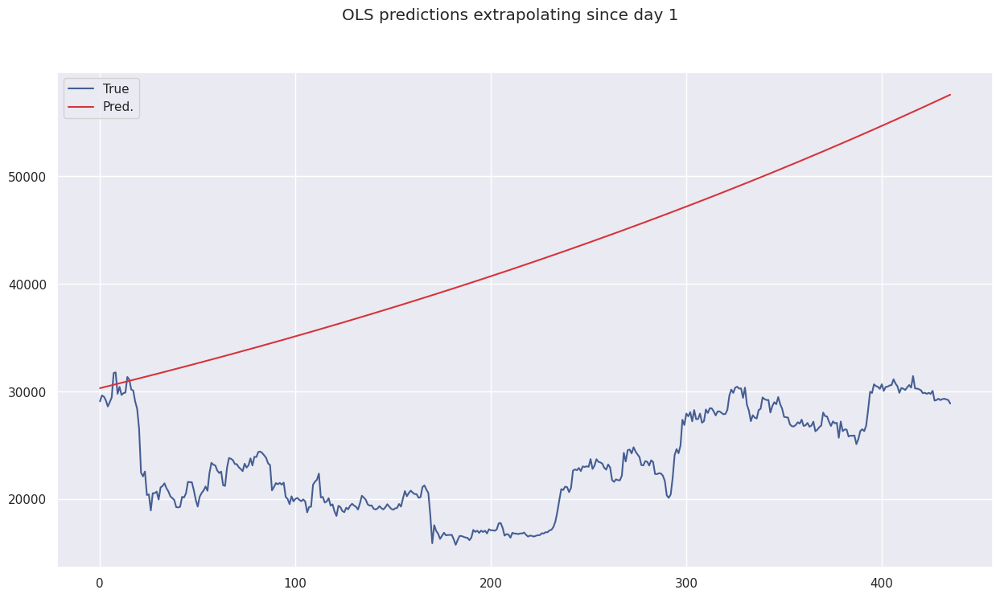

In [ ]:
fig = plt.figure(figsize=(15, 8))
_ = plt.suptitle("OLS predictions extrapolating since day 1")
_ = plt.plot(splits_weekly["test"]["y"], label="True")
_ = plt.plot(pred, label="Pred.")
_ = plt.legend()

## Treinamento inicial da LSTM

### Configuração

In [ ]:
config = {
    "optimizer": optim.Adam,
    "weight_decay": 1e-5,
    "n_epochs": 300,
    "loss_fn": torch.nn.MSELoss(),
    "patience": 20,
    "window_size": 7,
    "bs_train" : 16,
    "bs_val_test": 256,
    "num_layers" : 1,
    "hidden_size" : 80,
    "dropout_rate": 0.1,
    "learning_rate" : 5e-3,
    "use_lr_scheduler": True,
    "scheduler_type": "StepLR",  # Opções: "CosineAnnealingLR", "ReduceLROnPlateau", "StepLR", "CosineAnnealingWarmRestarts"
    "scheduler_params": {
        # Parâmetros comuns:
        "eta_min": 1e-6,
        "last_epoch": -1,
        "verbose": True,

        # Específicos para cada scheduler:
        "CosineAnnealingLR": {
            "T_max": 60
        },
        "StepLR": {
            "step_size": 20,
            "gamma": 0.7
        },
        "CosineAnnealingWarmRestarts": {
            "T_0": 50,
            "T_mult": 2
        },
        "ReduceLROnPlateau": {
            "mode": "min",
            "factor": 0.1,
            "patience": 10,
            "threshold": 1e-4
        }
    }
}

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Carregamento e pré-processamento dos dados

In [ ]:
train_data = data[data['split'] == 'train'].copy()
valid_data = data[data['split'] == 'valid'].copy()
test_data  = data[data['split'] == 'test'].copy()

In [ ]:
scaler = MinMaxScaler()

In [ ]:
scaler.fit(train_data[['close']])

MinMaxScaler()

In [ ]:
train_data['close'] = scaler.transform(train_data[['close']])
valid_data['close'] = scaler.transform(valid_data[['close']])
test_data['close'] = scaler.transform(test_data[['close']])

In [ ]:
scaled_data = pd.concat([train_data, valid_data, test_data], axis=0)

In [ ]:
scaled_data

,date,open,high,low,close,number_of_trades,split
0,2017-08-17,4261.48,4485.39,4200.74,0.018151,3427,train
1,2017-08-18,4285.08,4371.52,3938.77,0.015225,5233,train
2,2017-08-19,4108.37,4184.69,3850.00,0.015748,2153,train
3,2017-08-20,4139.98,4211.08,4032.62,0.014859,2321,train
4,2017-08-21,4069.13,4119.62,3911.79,0.013695,3972,train
...,...,...,...,...,...,...,...
2171,2023-07-28,29222.78,29542.22,29123.12,0.432636,543177,test
2172,2023-07-29,29314.14,29406.92,29256.18,0.433277,339750,test
2173,2023-07-30,29352.90,29449.00,29033.24,0.432088,454846,test
2174,2023-07-31,29281.09,29530.00,29101.80,0.431279,563115,test


In [ ]:
def create_dataloaders(splits, bs_train=64, bs_val_test=256):
    dataloaders = {}
    for split in splits:
        X = torch.tensor(splits[split]['X'], dtype=torch.float32)
        X = X.unsqueeze(-1)  # Adiciona a dimensão do input_size
        print

        y = torch.tensor(splits[split]['y'], dtype=torch.float32)
        dataset = TensorDataset(X, y)

        if split == 'train':
            batch_size = bs_train
            shuffle = True
        else:
            batch_size = bs_val_test
            shuffle = False

        dataloader = DataLoader(
            dataset, batch_size=batch_size, shuffle=shuffle, drop_last=False
        )
        dataloaders[split] = dataloader

    return dataloaders

In [ ]:
splits = get_lagged_splits(scaled_data, window_size=config["window_size"])
dataloaders = create_dataloaders(splits, bs_train=config['bs_train'], bs_val_test=config['bs_val_test'])

### Utilidades de treinamento

In [ ]:
class AverageMeter:
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [ ]:
def train_step(model, train_dl, loss_fn, optimizer, device):
    model.train()
    train_loss = AverageMeter()

    pbar = tqdm(train_dl, unit=" batch", position=0, leave=True)

    for train_instances, instance_labels in pbar:
        # Enviar para GPU ou CPU
        train_instances = train_instances.to(device)
        instance_labels = instance_labels.to(device)

        # Resetar gradientes
        optimizer.zero_grad()

        # Forward
        y_pred = model(train_instances)

        # Calcular loss
        loss = loss_fn(y_pred, instance_labels)

        # Backprop + clip gradiente
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)

        # Otimização
        optimizer.step()

        # Atualizar métrica
        train_loss.update(loss.item(), len(train_instances))

        # Atualizar barra de progresso
        pbar.set_description(f"train_loss {train_loss.avg:.6f}")

    return train_loss.avg

In [ ]:
def evaluation_step(
        model,
        evaluation_dl,
        loss_fn,
        device,
        name,
    ):
    model.eval()

    evaluation_loss = AverageMeter()

    with torch.no_grad():
        pbar = tqdm(evaluation_dl, unit=" batch", position=0, leave=True)
        for evaluation_instances, instance_labels in pbar:
            evaluation_instances = evaluation_instances.to(device)
            instance_labels = instance_labels.to(device)

            # Forward pass
            y_pred = model(evaluation_instances)

            # Calcular perda
            loss = loss_fn(y_pred, instance_labels)

            # Atualizar métrica de perda
            evaluation_loss.update(loss.item(), len(evaluation_instances))

            # Atualizar barra de progresso
            pbar.set_description(f"{name}_loss {evaluation_loss.avg:.7f}")

    return evaluation_loss.avg


In [ ]:
def train_model(
    model,
    dataloaders,
    config,
    device,
):
    # Início do treinamento
    start_time = time.time()
    print("\n🚀 Iniciando treinamento...")

    # Otimizador e scheduler
    optimizer = config["optimizer"](
        params=model.parameters(),
        lr=config["learning_rate"],
        weight_decay=config["weight_decay"]
    )

    # Inicialização do scheduler
    lr_scheduler = None
    if config.get("use_lr_scheduler", False):
        scheduler_type = config.get("scheduler_type", "CosineAnnealingLR")
        scheduler_params = config["scheduler_params"]

        try:
            if scheduler_type == "CosineAnnealingLR":
                lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
                    optimizer,
                    T_max=scheduler_params["CosineAnnealingLR"]["T_max"],
                    eta_min=scheduler_params.get("eta_min", 0),
                    last_epoch=scheduler_params.get("last_epoch", -1)
                )

            elif scheduler_type == "StepLR":
                lr_scheduler = torch.optim.lr_scheduler.StepLR(
                    optimizer,
                    step_size=scheduler_params["StepLR"]["step_size"],
                    gamma=scheduler_params["StepLR"]["gamma"],
                    last_epoch=scheduler_params.get("last_epoch", -1)
                )

            elif scheduler_type == "CosineAnnealingWarmRestarts":
                lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
                    optimizer,
                    T_0=scheduler_params["CosineAnnealingWarmRestarts"]["T_0"],
                    T_mult=scheduler_params["CosineAnnealingWarmRestarts"].get("T_mult", 1),
                    eta_min=scheduler_params.get("eta_min", 0),
                    last_epoch=scheduler_params.get("last_epoch", -1)
                )

            elif scheduler_type == "ReduceLROnPlateau":
                lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
                    optimizer,
                    mode=scheduler_params["ReduceLROnPlateau"]["mode"],
                    factor=scheduler_params["ReduceLROnPlateau"]["factor"],
                    patience=scheduler_params["ReduceLROnPlateau"]["patience"],
                    threshold=scheduler_params["ReduceLROnPlateau"]["threshold"],
                    verbose=scheduler_params.get("verbose", False)
                )

            else:
                raise ValueError(f"Tipo de scheduler não suportado: {scheduler_type}")

        except KeyError as e:
            raise ValueError(f"Parâmetro faltando para {scheduler_type}: {str(e)}")

    # Separar dataloaders
    if len(dataloaders) == 2:
        train_dl, val_dl = list(dataloaders.values())
        test_dl = None
    else:
        train_dl, val_dl, test_dl = list(dataloaders.values())

    # Histórico de treino
    history = {
        "train": {"loss": [], "lr": []},
        "valid": {"loss": []},
        "best_epoch": 0,
        "time_elapsed": 0.0,
        "epoch_times": []
    }

    best_loss = float("inf")
    early_stop_counter = 0

    for epoch in range(config["n_epochs"]):
        epoch_start = time.time()
        current_lr = optimizer.param_groups[0]['lr']
        print(f"\nEpoch {epoch + 1}/{config['n_epochs']} - LR: {current_lr:.2e}")


        # Treinamento
        train_loss = train_step(
            model=model,
            train_dl=train_dl,
            loss_fn=config["loss_fn"],
            optimizer=optimizer,
            device=device,
        )

        # Validação
        valid_loss = evaluation_step(
            model=model,
            evaluation_dl=val_dl,
            loss_fn=config["loss_fn"],
            device=device,
            name="valid"
        )

        # Registrar tempo da época
        epoch_time = time.time() - epoch_start
        history["epoch_times"].append(epoch_time)

        # Histórico
        history["train"]["loss"].append(train_loss)
        history["train"]["lr"].append(current_lr)
        history["valid"]["loss"].append(valid_loss)

        # Atualizar lr scheduler
        if lr_scheduler is not None:
            if isinstance(lr_scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
                lr_scheduler.step(valid_loss)
            else:
                lr_scheduler.step()

        # Early stopping
        if valid_loss < best_loss:
            print("✅ Validation loss improved. Saving best model...")
            best_loss = valid_loss
            early_stop_counter = 0
            torch.save(model.state_dict(), "best_model_state_dict.pth")
        else:
            early_stop_counter += 1
            print(f"🛑 No improvement. Early stop counter: {early_stop_counter}/{config['patience']}")
            if early_stop_counter >= config["patience"]:
                print("⛔️ Early stopping triggered.")
                break

        # Mostrar tempo da época
        print(f"Tempo: {epoch_time:.1f}s")

    # Tempo total
    total_time = time.time() - start_time
    history["time_elapsed"] = total_time

    # Carregar melhor modelo
    model.load_state_dict(torch.load("best_model_state_dict.pth", map_location=device))

    # Avaliação final no test
    if test_dl is not None:
        print("\n📊 Final evaluation on test set:")
        test_loss = evaluation_step(
            model=model,
            evaluation_dl=test_dl,
            loss_fn=config["loss_fn"],
            device=device,
            name="test"
        )
        history["test"] = {"loss": test_loss}

    return history

In [ ]:
def plot(history):
    plt.figure(figsize=(10, 6))
    plt.title("Loss durante o treinamento")
    plt.plot(history["train"]["loss"], c="black", label="Train")
    plt.plot(history["valid"]["loss"], c="red", label="Valid.")
    plt.xlabel("Época")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

### Definição de modelo

In [ ]:
class LSTMModel(nn.Module):
    def __init__(self, input_size=1, hidden_size=50, num_layers=1, dropout_rate=0.2):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(
            input_size,
            hidden_size,
            num_layers,
            batch_first=True,
            dropout=dropout_rate if num_layers > 1 else 0  # Dropout só funciona com num_layers > 1
        )
        self.dropout = nn.Dropout(dropout_rate)  # Dropout adicional após LSTM
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.dropout(out[:, -1, :])  # Aplicar dropout na última saída
        out = self.fc(out)
        return out.squeeze()

In [ ]:
model = LSTMModel(
    hidden_size=config["hidden_size"],
    num_layers=config["num_layers"],
    dropout_rate=config["dropout_rate"]
)

In [ ]:
summary(model, input_size=(config["bs_train"], config["window_size"], 1))

Layer (type:depth-idx)                   Output Shape              Param #
LSTMModel                                [16]                      --
├─LSTM: 1-1                              [16, 7, 80]               26,560
├─Dropout: 1-2                           [16, 80]                  --
├─Linear: 1-3                            [16, 1]                   81
Total params: 26,641
Trainable params: 26,641
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 2.98
Input size (MB): 0.00
Forward/backward pass size (MB): 0.07
Params size (MB): 0.11
Estimated Total Size (MB): 0.18

### Treinamento

In [ ]:
history = train_model(
    model=model,
    dataloaders=dataloaders,
    config=config,
    device=device
)


🚀 Iniciando treinamento...

Epoch 1/300 - LR: 5.00e-03


valid_loss 0.0007244: 100%|██████████| 1/1 [00:00<00:00, 255.45 batch/s]


✅ Validation loss improved. Saving best model...
Tempo: 0.4s

Epoch 2/300 - LR: 5.00e-03


valid_loss 0.0007361: 100%|██████████| 1/1 [00:00<00:00, 170.15 batch/s]


🛑 No improvement. Early stop counter: 1/20
Tempo: 0.5s

Epoch 3/300 - LR: 5.00e-03


valid_loss 0.0011871: 100%|██████████| 1/1 [00:00<00:00, 208.97 batch/s]


🛑 No improvement. Early stop counter: 2/20
Tempo: 0.5s

Epoch 4/300 - LR: 5.00e-03


valid_loss 0.0007904: 100%|██████████| 1/1 [00:00<00:00, 236.30 batch/s]


🛑 No improvement. Early stop counter: 3/20
Tempo: 0.5s

Epoch 5/300 - LR: 5.00e-03


valid_loss 0.0007833: 100%|██████████| 1/1 [00:00<00:00, 241.64 batch/s]


🛑 No improvement. Early stop counter: 4/20
Tempo: 0.5s

Epoch 6/300 - LR: 5.00e-03


valid_loss 0.0006909: 100%|██████████| 1/1 [00:00<00:00, 227.89 batch/s]


✅ Validation loss improved. Saving best model...
Tempo: 0.5s

Epoch 7/300 - LR: 5.00e-03


valid_loss 0.0007175: 100%|██████████| 1/1 [00:00<00:00, 180.52 batch/s]


🛑 No improvement. Early stop counter: 1/20
Tempo: 0.4s

Epoch 8/300 - LR: 5.00e-03


valid_loss 0.0007327: 100%|██████████| 1/1 [00:00<00:00, 218.94 batch/s]


🛑 No improvement. Early stop counter: 2/20
Tempo: 0.4s

Epoch 9/300 - LR: 5.00e-03


valid_loss 0.0007240: 100%|██████████| 1/1 [00:00<00:00, 277.44 batch/s]


🛑 No improvement. Early stop counter: 3/20
Tempo: 0.4s

Epoch 10/300 - LR: 5.00e-03


valid_loss 0.0006708: 100%|██████████| 1/1 [00:00<00:00, 226.94 batch/s]


✅ Validation loss improved. Saving best model...
Tempo: 0.4s

Epoch 11/300 - LR: 5.00e-03


valid_loss 0.0008786: 100%|██████████| 1/1 [00:00<00:00, 215.67 batch/s]


🛑 No improvement. Early stop counter: 1/20
Tempo: 0.4s

Epoch 12/300 - LR: 5.00e-03


valid_loss 0.0008354: 100%|██████████| 1/1 [00:00<00:00, 246.51 batch/s]


🛑 No improvement. Early stop counter: 2/20
Tempo: 0.4s

Epoch 13/300 - LR: 5.00e-03


valid_loss 0.0007147: 100%|██████████| 1/1 [00:00<00:00, 286.42 batch/s]


🛑 No improvement. Early stop counter: 3/20
Tempo: 0.4s

Epoch 14/300 - LR: 5.00e-03


valid_loss 0.0014386: 100%|██████████| 1/1 [00:00<00:00, 235.15 batch/s]


🛑 No improvement. Early stop counter: 4/20
Tempo: 0.4s

Epoch 15/300 - LR: 5.00e-03


valid_loss 0.0011474: 100%|██████████| 1/1 [00:00<00:00, 185.70 batch/s]


🛑 No improvement. Early stop counter: 5/20
Tempo: 0.4s

Epoch 16/300 - LR: 5.00e-03


valid_loss 0.0006912: 100%|██████████| 1/1 [00:00<00:00, 274.41 batch/s]


🛑 No improvement. Early stop counter: 6/20
Tempo: 0.4s

Epoch 17/300 - LR: 5.00e-03


valid_loss 0.0006722: 100%|██████████| 1/1 [00:00<00:00, 280.69 batch/s]


🛑 No improvement. Early stop counter: 7/20
Tempo: 0.4s

Epoch 18/300 - LR: 5.00e-03


valid_loss 0.0007011: 100%|██████████| 1/1 [00:00<00:00, 274.86 batch/s]


🛑 No improvement. Early stop counter: 8/20
Tempo: 0.4s

Epoch 19/300 - LR: 5.00e-03


valid_loss 0.0007112: 100%|██████████| 1/1 [00:00<00:00, 312.26 batch/s]


🛑 No improvement. Early stop counter: 9/20
Tempo: 0.4s

Epoch 20/300 - LR: 5.00e-03


valid_loss 0.0007948: 100%|██████████| 1/1 [00:00<00:00, 270.62 batch/s]


🛑 No improvement. Early stop counter: 10/20
Tempo: 0.4s

Epoch 21/300 - LR: 3.50e-03


valid_loss 0.0006840: 100%|██████████| 1/1 [00:00<00:00, 232.55 batch/s]


🛑 No improvement. Early stop counter: 11/20
Tempo: 0.4s

Epoch 22/300 - LR: 3.50e-03


valid_loss 0.0007282: 100%|██████████| 1/1 [00:00<00:00, 204.34 batch/s]


🛑 No improvement. Early stop counter: 12/20
Tempo: 0.4s

Epoch 23/300 - LR: 3.50e-03


valid_loss 0.0007452: 100%|██████████| 1/1 [00:00<00:00, 232.47 batch/s]


🛑 No improvement. Early stop counter: 13/20
Tempo: 0.4s

Epoch 24/300 - LR: 3.50e-03


valid_loss 0.0008805: 100%|██████████| 1/1 [00:00<00:00, 215.70 batch/s]


🛑 No improvement. Early stop counter: 14/20
Tempo: 0.4s

Epoch 25/300 - LR: 3.50e-03


valid_loss 0.0007518: 100%|██████████| 1/1 [00:00<00:00, 277.29 batch/s]


🛑 No improvement. Early stop counter: 15/20
Tempo: 0.4s

Epoch 26/300 - LR: 3.50e-03


valid_loss 0.0007307: 100%|██████████| 1/1 [00:00<00:00, 281.01 batch/s]


🛑 No improvement. Early stop counter: 16/20
Tempo: 0.4s

Epoch 27/300 - LR: 3.50e-03


valid_loss 0.0007215: 100%|██████████| 1/1 [00:00<00:00, 284.32 batch/s]


🛑 No improvement. Early stop counter: 17/20
Tempo: 0.4s

Epoch 28/300 - LR: 3.50e-03


valid_loss 0.0006798: 100%|██████████| 1/1 [00:00<00:00, 128.10 batch/s]


🛑 No improvement. Early stop counter: 18/20
Tempo: 0.4s

Epoch 29/300 - LR: 3.50e-03


valid_loss 0.0007592: 100%|██████████| 1/1 [00:00<00:00, 199.77 batch/s]


🛑 No improvement. Early stop counter: 19/20
Tempo: 0.4s

Epoch 30/300 - LR: 3.50e-03


valid_loss 0.0007049: 100%|██████████| 1/1 [00:00<00:00, 304.97 batch/s]


🛑 No improvement. Early stop counter: 20/20
⛔️ Early stopping triggered.

📊 Final evaluation on test set:


test_loss 0.0001382: 100%|██████████| 2/2 [00:00<00:00, 201.42 batch/s]


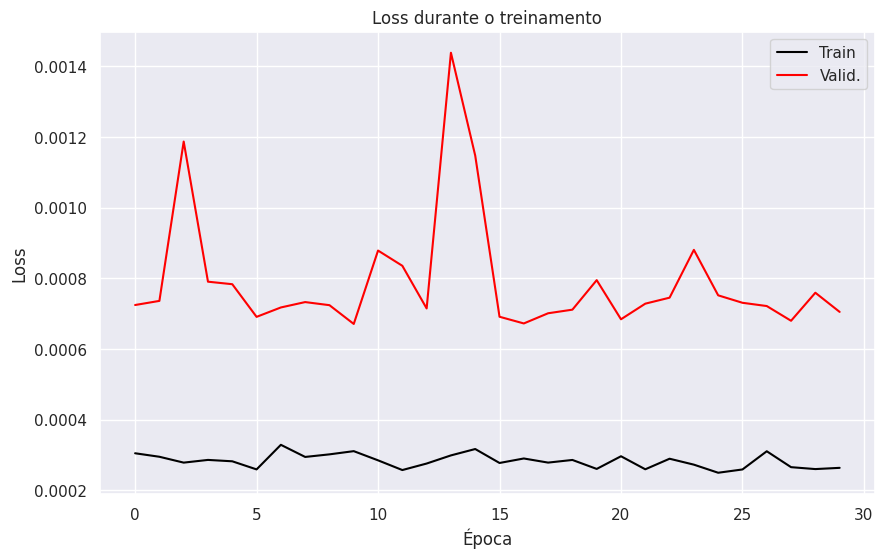

In [ ]:
plot(history)

### Avaliação do modelo

In [ ]:
def rmse(target, output):
    return ((target - output)**2).mean()**0.5

def mae(target, output):
    return abs(target - output).mean()

def mape(target, output):
    return abs((target - output) / (target + 1e-8)).mean()

In [ ]:
all_preds = []
all_targets = []

model.eval()
with torch.no_grad():
    for inputs, target in dataloaders["test"]:
        inputs = inputs.to(device)
        pred = model(inputs)

        pred = pred.cpu().numpy()
        target = target.cpu().numpy()

        all_preds.append(pred)
        all_targets.append(target)

preds_array = scaler.inverse_transform(np.concatenate(all_preds, axis=0).reshape(-1, 1))
targets_array = scaler.inverse_transform(np.concatenate(all_targets, axis=0).reshape(-1, 1))

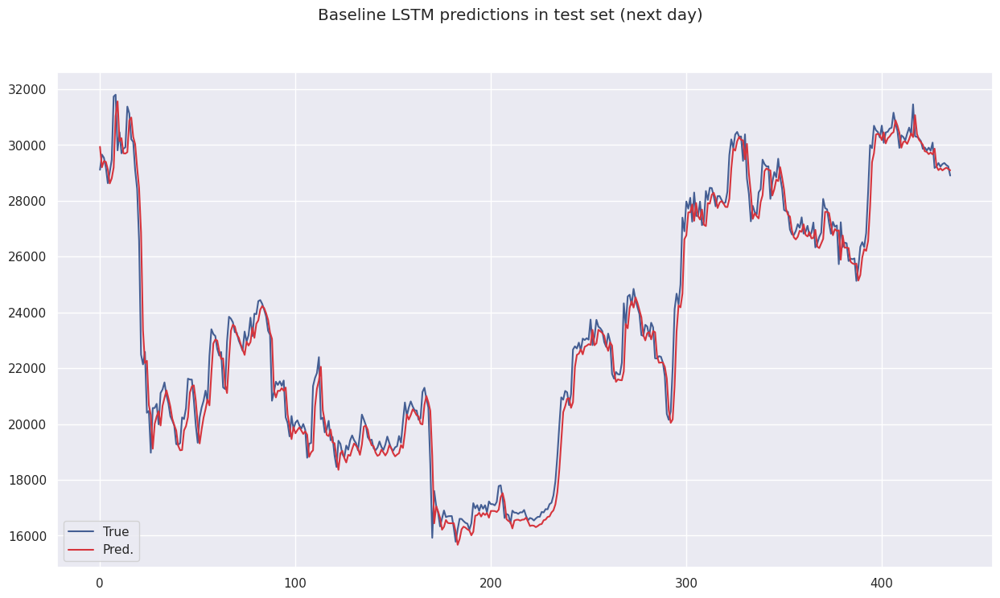

In [ ]:
fig = plt.figure(figsize=(15, 8))
_ = plt.suptitle("Baseline LSTM predictions in test set (next day)")
_ = plt.plot(targets_array, label="True")
_ = plt.plot(preds_array, label="Pred.")
_ = plt.legend()

In [ ]:
rmse(targets_array, preds_array)

np.float32(719.3736)

In [ ]:
mae(targets_array, preds_array)

np.float32(489.20392)

In [ ]:
mape(targets_array, preds_array) * 100

np.float32(2.1475062)

In [ ]:
window = pd.DataFrame(splits_weekly["test"]["X"][0].reshape(-1, 1), columns=["close"])
window = scaler.transform(window)
window = torch.Tensor(window).unsqueeze(0)
pred_extra = []
model.eval()
with torch.no_grad():
    for i in range(len(splits_weekly["test"]["X"])):
        curr = model(window.to(device)).item()
        pred_extra.append(float(curr))
        window[:-1] = window[1:]
        window[-1] = curr

In [ ]:
pred_extra = scaler.inverse_transform(np.float32(pred_extra).reshape(-1, 1))

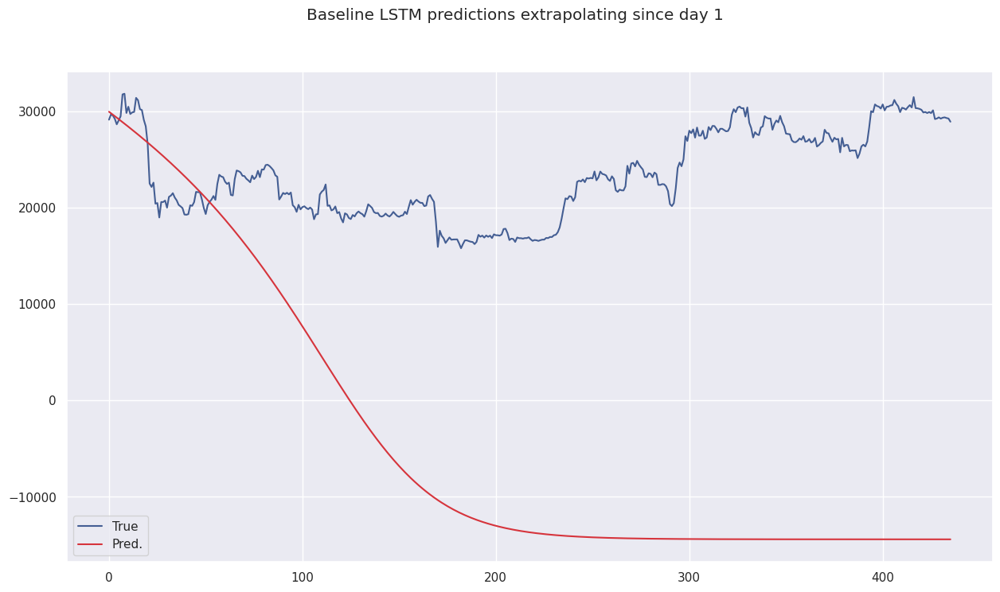

In [ ]:
fig = plt.figure(figsize=(15, 8))
_ = plt.suptitle("Baseline LSTM predictions extrapolating since day 1")
_ = plt.plot(targets_array, label="True")
_ = plt.plot(pred_extra, label="Pred.")
_ = plt.legend()